In [1]:
import numpy as np
import pandas as pd
import pickle
from keras.layers import Conv2D, Dense, Dropout, Flatten, Input, Add, MaxPool2D, \
                            GlobalAveragePooling2D, DepthwiseConv2D, BatchNormalization, LeakyReLU
from keras import regularizers
from keras.models import Sequential, load_model, Model
from keras.preprocessing.image import ImageDataGenerator, array_to_img, img_to_array, load_img
from keras.utils import print_summary, plot_model, to_categorical
from keras.callbacks import TensorBoard, ModelCheckpoint, ReduceLROnPlateau
from keras.optimizers import SGD, RMSprop, Adam, Adagrad, Adadelta, RMSprop
# from keras.applications.vgg16 import VGG16, preprocess_input
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras import applications
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.utils import class_weight

from numpy.random import seed
from tensorflow import set_random_seed

import cv2
from glob import glob
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
import random
from math import ceil

import seaborn as sns
sns.set()
import itertools

import time, datetime, pytz

import sys
import os
from os import getenv
from pathlib import Path

Using TensorFlow backend.
C:\Users\yut\AppData\Local\Programs\Python\Python37\lib\site-packages\tensorflow\python\framework\dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\yut\AppData\Local\Programs\Python\Python37\lib\site-packages\tensorflow\python\framework\dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\yut\AppData\Local\Programs\Python\Python37\lib\site-packages\tensorflow\python\framework\dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])

In [4]:
def print_time(end='\n'):
    dt = datetime.datetime.fromtimestamp(time.time()).astimezone(pytz.timezone('Asia/Hong_Kong'))
    print("[%s] " % dt, end=end)
    
def get_datetime():
    dt = datetime.datetime.fromtimestamp(time.time()).astimezone(pytz.timezone('Asia/Hong_Kong'))
    return dt.strftime("%Y-%m-%d_%H.%M.%S")

In [5]:
SEED = 1
seed(SEED)
set_random_seed(SEED)

SAVE_OUTPUT_TO_FILE = True
SAVE_MODEL_TO_FILE = True
RELOAD_MODEL_FROM_FILE = True

exec_time = get_datetime()

MODEL_NAME = exec_time + '-model'
MODEL_DIR = 'model/unknow-pretrained-model'
MODEL_SAVE_DIR = MODEL_DIR + '/' + MODEL_NAME + '.h5'
MODEL_SAVE_WEIGHTS_DIR = MODEL_DIR + '/' + MODEL_NAME + '.weights.h5'
MODEL_SAVE_TRAIN_LOG_DIR = MODEL_DIR + '/' + MODEL_NAME + '-train-log.pickle'

# RELOAD_MODEL_NAME = '2019-04-09_12.15.56-model'
RELOAD_MODEL_NAME = '2019-05-10_11.17.23-model'
RELOAD_MODEL_BASE = 'model/alaxnet-pretrained-model'
RELOAD_MODEL_DIR = RELOAD_MODEL_BASE + '/' + RELOAD_MODEL_NAME + '.h5'
RELOAD_MODEL_WEIGHTS_DIR = RELOAD_MODEL_BASE + '/' + RELOAD_MODEL_NAME + '.weights.h5'
RELOAD_MODEL_TRAIN_LOG_DIR = RELOAD_MODEL_BASE + '/' + RELOAD_MODEL_NAME + '-train-log.pickle'

DEFAULT_STDOUT = sys.stdout
TRAIN_DIR = 'data/input/asl-alphabet/asl_alphabet_train/asl_alphabet_train'
TEST_DIR = 'data/input/asl-alphabet/asl_alphabet_test/asl_alphabet_test'
CUSTOM_TEST_DIR = 'data/input/asl-alphabet-test/asl-alphabet-test'
CLASSES = [os.path.basename(folder) for folder in glob(TRAIN_DIR + '/*')]
CLASSES.remove('J')
CLASSES.remove('Z')
CLASSES.sort()

BATCH_SIZE, HEIGHT, WIDTH, CHANNELS = 64, 64, 64, 3
SAMPLE_SIZE = (HEIGHT, WIDTH)
INPUT_DIMS = (HEIGHT, WIDTH, CHANNELS)
NUM_CLASSES = len(CLASSES)
VALIDATION_SPLIT = 0.1

print("Classes: %s \n" % CLASSES)

print("Use the reloaded model: %s" % ("Yes" if RELOAD_MODEL_FROM_FILE else "No"))
if RELOAD_MODEL_FROM_FILE:
    print("Reloading from \n  * \"%s\" \n  * \"%s\" \n" 
          % (RELOAD_MODEL_DIR, RELOAD_MODEL_WEIGHTS_DIR))


print("Save Output to File: %s" % ("Yes" if SAVE_OUTPUT_TO_FILE else "No"))
if SAVE_OUTPUT_TO_FILE:
    OUT_FILE_NAME = exec_time+'_out.txt'
    print("Save Output to %s \n" % OUT_FILE_NAME)
#     sys.stdout = open(OUT_FILE_NAME, 'w+')

Classes: ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'del', 'nothing', 'space'] 

Use the reloaded model: Yes
Reloading from 
  * "model/alaxnet-pretrained-model/2019-05-10_11.17.23-model.h5" 
  * "model/alaxnet-pretrained-model/2019-05-10_11.17.23-model.weights.h5" 

Save Output to File: Yes
Save Output to 2019-11-30_09.40.01_out.txt 



In [10]:
X_train, X_test, Y_train, Y_test = load_data_old(TRAIN_DIR, VALIDATION_SPLIT)

LOADING DATA FROM : A |B |C |D |E |F |G |H |I |K |L |M |N |O |P |Q |R |S |T |U |V |W |X |Y |del |nothing |space |
Loaded 72900 images for training, Train data shape = (72900, 64, 64, 3)
Loaded 8100 images for testing Test data shape = (8100, 64, 64, 3)


In [6]:
# labels_dict = {'A':0,'B':1,'C':2,'D':3,'E':4,'F':5,'G':6,'H':7,'I':8,'J':9,'K':10,'L':11,'M':12,
#                'N':13,'O':14,'P':15,'Q':16,'R':17,'S':18,'T':19,'U':20,'V':21,'W':22,'X':23,'Y':24,
#                'Z':25,'space':26,'del':27,'nothing':28}
labels_dict = {}
i = 0
for char in CLASSES:
    labels_dict[char] = i
    i += 1

def load_data_old(DIR, VALI_SPLIT):
    train_dir = DIR
    images = []
    labels = []
    size = HEIGHT,WIDTH
    print("LOADING DATA FROM : ",end = "")
    for folder in sorted(os.listdir(train_dir)):
        if folder in ['J', 'Z']:
            continue
        print(folder, end = ' | ')
        for image in os.listdir(train_dir + "/" + folder):
            temp_img = cv2.imread(train_dir + '/' + folder + '/' + image)
            temp_img = cv2.resize(temp_img, size)
            images.append(temp_img)
            if folder == 'A':
                labels.append(labels_dict['A'])
            elif folder == 'B':
                labels.append(labels_dict['B'])
            elif folder == 'C':
                labels.append(labels_dict['C'])
            elif folder == 'D':
                labels.append(labels_dict['D'])
            elif folder == 'E':
                labels.append(labels_dict['E'])
            elif folder == 'F':
                labels.append(labels_dict['F'])
            elif folder == 'G':
                labels.append(labels_dict['G'])
            elif folder == 'H':
                labels.append(labels_dict['H'])
            elif folder == 'I':
                labels.append(labels_dict['I'])
#             elif folder == 'J':
#                 labels.append(labels_dict['J'])
            elif folder == 'K':
                labels.append(labels_dict['K'])
            elif folder == 'L':
                labels.append(labels_dict['L'])
            elif folder == 'M':
                labels.append(labels_dict['M'])
            elif folder == 'N':
                labels.append(labels_dict['N'])
            elif folder == 'O':
                labels.append(labels_dict['O'])
            elif folder == 'P':
                labels.append(labels_dict['P'])
            elif folder == 'Q':
                labels.append(labels_dict['Q'])
            elif folder == 'R':
                labels.append(labels_dict['R'])
            elif folder == 'S':
                labels.append(labels_dict['S'])
            elif folder == 'T':
                labels.append(labels_dict['T'])
            elif folder == 'U':
                labels.append(labels_dict['U'])
            elif folder == 'V':
                labels.append(labels_dict['V'])
            elif folder == 'W':
                labels.append(labels_dict['W'])
            elif folder == 'X':
                labels.append(labels_dict['X'])
            elif folder == 'Y':
                labels.append(labels_dict['Y'])
#             elif folder == 'Z':
#                 labels.append(labels_dict['Z'])
            elif folder == 'space':
                labels.append(labels_dict['space'])
            elif folder == 'del':
                labels.append(labels_dict['del'])
            elif folder == 'nothing':
                labels.append(labels_dict['nothing'])
    
    images = np.array(images)
#     images = images.astype('float32')
    images = images.astype('float32')/255.0
#     images = preprocess_input(images)
    
    labels = to_categorical(labels)
    
    X_train, X_test, Y_train, Y_test = train_test_split(images, labels, test_size = VALI_SPLIT)
    
    print()
    print('Loaded', len(X_train),'images for training,','Train data shape =',X_train.shape)
    print('Loaded', len(X_test),'images for testing','Test data shape =',X_test.shape)
    
    return X_train, X_test, Y_train, Y_test

In [7]:
X1_train, X1_test, Y1_train, Y1_test = load_data_old(CUSTOM_TEST_DIR, 0.01)

LOADING DATA FROM : A | B | C | D |E | F | G |H | I | K |L | M | N | O |P | Q | R | S | T |U | V | W |X | Y |del | nothing | space |
Loaded 801 images for training, Train data shape = (801, 64, 64, 3)
Loaded 9 images for testing Test data shape = (9, 64, 64, 3)


In [45]:
X_train

array([[[0.9137255 , 0.01568628, 0.02352941],
        [0.7019608 , 0.03137255, 0.02745098],
        [0.7254902 , 0.02352941, 0.03921569],
        ...,
        [0.72156864, 0.03137255, 0.05098039],
        [0.7058824 , 0.02352941, 0.05490196],
        [0.8392157 , 0.04705882, 0.05490196]],

       [[0.72156864, 0.03137255, 0.03137255],
        [0.01176471, 0.05098039, 0.10588235],
        [0.        , 0.03529412, 0.10588235],
        ...,
        [0.22352941, 0.2509804 , 0.2901961 ],
        [0.26666668, 0.23921569, 0.28627452],
        [0.5019608 , 0.19215687, 0.20784314]],

       [[0.70980394, 0.02745098, 0.06666667],
        [0.03921569, 0.08627451, 0.18039216],
        [0.02745098, 0.07843138, 0.11372549],
        ...,
        [0.18431373, 0.22745098, 0.25882354],
        [0.24705882, 0.23137255, 0.27058825],
        [0.5254902 , 0.18431373, 0.2       ]],

       ...,

       [[0.7607843 , 0.05098039, 0.07450981],
        [0.54509807, 0.5882353 , 0.60784316],
        [0.5647059 , 0

In [15]:
train_image_generator = ImageDataGenerator(
    samplewise_center=True,
    samplewise_std_normalization=True,
    preprocessing_function=preprocess_input,
#     featurewise_center=True,
#     featurewise_std_normalization=True,
#     zca_whitening=True,
#     rotation_range=20,
#     width_shift_range=0.2,
#     height_shift_range=0.2,
#     horizontal_flip=True
)
# train_image_generator.fit(X_train)

val_image_generator = ImageDataGenerator(
    samplewise_center=True,
    samplewise_std_normalization=True,
    preprocessing_function=preprocess_input,
#     featurewise_center=True,
#     featurewise_std_normalization=True,
#     zca_whitening=True,
)
# val_image_generator.fit(X_train)

train_generator = train_image_generator.flow(x=X_train, y=Y_train, batch_size=BATCH_SIZE, shuffle=True)
val_generator = val_image_generator.flow(x=X_test, y=Y_test, batch_size=BATCH_SIZE, shuffle=False)

NUM_TRAIN_SAMPLE = train_generator.n
NUM_VAL_SAMPLE = val_generator.n

In [8]:
def reload_model():
    old_model_file = Path(RELOAD_MODEL_DIR)
    old_weight_file = Path(RELOAD_MODEL_WEIGHTS_DIR)
    old_train_log_file = Path(RELOAD_MODEL_TRAIN_LOG_DIR)
    if old_model_file.is_file() and old_weight_file.is_file() and old_train_log_file.is_file():
        print("Reloading old model, weights and training log from disk")
        model = load_model(RELOAD_MODEL_DIR)
        model.load_weights(RELOAD_MODEL_WEIGHTS_DIR)
        with open(RELOAD_MODEL_TRAIN_LOG_DIR, 'rb') as file:
            train_log = pickle.load(file)
        print("Done!")
        return model, train_log
    else:
        print("Cannot reload the old model, weight and training log from\n  * \"%s\"\n  * \"%s\"\n  * \"%s\"" 
              % (RELOAD_MODEL_DIR, RELOAD_MODEL_WEIGHTS_DIR, RELOAD_MODEL_TRAIN_LOG_DIR))
        print("Please check if the path is correct or not")
        return None, None

if RELOAD_MODEL_FROM_FILE:
    model, train_log = reload_model()

Reloading old model, weights and training log from disk

Done!


In [ ]:
def define_model():
    
    model = Sequential()
    model.add(Conv2D(64, kernel_size=4, strides=1, activation='relu', input_shape=INPUT_DIMS))
    model.add(Conv2D(64, kernel_size=4, strides=2, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Conv2D(128, kernel_size=4, strides=1, activation='relu'))
    model.add(Conv2D(128, kernel_size=4, strides=2, activation='relu'))
    model.add(Dropout(0.5))
    model.add(Conv2D(256, kernel_size=4, strides=1, activation='relu'))
    model.add(Conv2D(256, kernel_size=4, strides=2, activation='relu'))
    model.add(Flatten())
    model.add(Dropout(0.5))
    model.add(Dense(512, activation='relu'))
    model.add(Dense(NUM_CLASSES, activation='softmax'))
    # model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])


#     model = Sequential()
    
#     model.add(Conv2D(16, kernel_size = [3,3], padding = 'same', activation = 'relu', input_shape = INPUT_DIMS))
#     model.add(Conv2D(32, kernel_size = [3,3], padding = 'same', activation = 'relu'))
#     model.add(MaxPool2D(pool_size = [3,3]))
    
#     model.add(Conv2D(32, kernel_size = [3,3], padding = 'same', activation = 'relu'))
#     model.add(Conv2D(64, kernel_size = [3,3], padding = 'same', activation = 'relu'))
#     model.add(MaxPool2D(pool_size = [3,3]))
    
#     model.add(Conv2D(128, kernel_size = [3,3], padding = 'same', activation = 'relu'))
#     model.add(Conv2D(256, kernel_size = [3,3], padding = 'same', activation = 'relu'))
#     model.add(MaxPool2D(pool_size = [3,3]))
    
#     model.add(BatchNormalization())
    
#     model.add(Flatten())
#     model.add(Dropout(0.5))
#     model.add(Dense(512, activation = 'relu', kernel_regularizer = regularizers.l2(0.001)))
#     model.add(Dense(29, activation = 'softmax'))
    
#     model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ["accuracy"])
# #     model.compile(optimizer = 'rmsprop', loss = 'categorical_crossentropy', metrics = ["accuracy"])


#     inputs = Input(shape=INPUT_DIMS)
#     net = Conv2D(32, kernel_size=3, strides=1, padding="same")(inputs)
#     net = LeakyReLU()(net)
#     net = Conv2D(32, kernel_size=3, strides=1, padding="same")(net)
#     net = LeakyReLU()(net)
#     net = Conv2D(32, kernel_size=3, strides=2, padding="same")(net)
#     net = LeakyReLU()(net)

#     net = Conv2D(32, kernel_size=3, strides=1, padding="same")(net)
#     net = LeakyReLU()(net)
#     net = Conv2D(32, kernel_size=3, strides=1, padding="same")(net)
#     net = LeakyReLU()(net)
#     net = Conv2D(32, kernel_size=3, strides=2, padding="same")(net)
#     net = LeakyReLU()(net)

#     shortcut = net

#     net = DepthwiseConv2D(kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal')(net)
#     net = BatchNormalization(axis=3)(net)
#     net = LeakyReLU()(net)
#     net = Conv2D(filters=32, kernel_size=1, strides=1, padding='same', kernel_initializer='he_normal')(net)
#     net = BatchNormalization(axis=3)(net)
#     net = LeakyReLU()(net)

#     net = DepthwiseConv2D(kernel_size=3, strides=1, padding='same', kernel_initializer='he_normal')(net)
#     net = BatchNormalization(axis=3)(net)
#     net = LeakyReLU()(net)
#     net = Conv2D(filters=32, kernel_size=1, strides=1, padding='same', kernel_initializer='he_normal')(net)
#     net = BatchNormalization(axis=3)(net)
#     net = LeakyReLU()(net)

#     net = Add()([net, shortcut])

#     net = GlobalAveragePooling2D()(net)
#     net = Dropout(0.2)(net)

#     net = Dense(128, activation='relu')(net)
#     outputs = Dense(NUM_CLASSES, activation='softmax')(net)

#     model = Model(inputs=inputs, outputs=outputs)
#     model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=["accuracy"])


#     map_characters = {0: 'A', 1: 'B', 2: 'C', 3: 'D', 4: 'E', 5: 'F', 6: 'G', 7: 'H', 8: 'I', 9: 'J', 
#                       10: 'K', 11: 'L', 12: 'M', 13: 'N', 14: 'O', 15: 'P', 16: 'Q', 17: 'R', 18: 'S', 
#                       19: 'T', 20: 'U', 21: 'V', 22: 'W', 23: 'X', 24: 'Y', 25: 'Z', 
                      26: 'del', 27: 'nothing', 28: 'space', 29: 'otr'}
#     map_characters1 = map_charaers
#     Y_train_1 = np.argmax(Y_train, ax=1)
#     class_weight1 = class_weight.compute_class_weight('balanced', np.unique(Y_train_1), Y_tra_1)
#     weight_patdata = '../input/keras-pretrained-modpretrain-modelmresnet50_weights_tf_dim_ordering_tf_kernels.h5 = '../input/keras-pretrained-modpretrain-models_tf_dim_ordering_tf_kernels_notoh5'
#     pretrained_model_1 = VGG16(weights = weight_path1, include_top=False, input_shape=(HEIGHT, WIDTH3))
    # pretrained_model_2 = InceptionV3(weights = weight_path2, include_top=False, input_shape=(HEIGHT, WIDTH3))
#     optimizer1 = Am()
# #     optimizer2 = RMSpropr=0.01)

#     optimizer = optimer2
#     base_model = pretrained_model_1 # Topless
    
#     # Add top layer
#     x = base_model.output
#     x = Flatten()(x)
#     predictions = Dense(NUM_CLASSES, activation='softmax')(x)
#     model = Model(inputs=base_model.input, outputs=predictions)
    
#     # Train top layer
#     for layer in base_model.layers:
#         layer.trainable = False
#     model.compile(loss='categorical_crossentropy', 
#                   optimizer=optimir, 
#       #             metrics=['accuracy'])
    
    if SAVE_MODEL_TO_FILE:
        model.save(MODEL_SAVE_DIR)
    return model

if not RELOAD_MODEL_FROM_FILE:
    print("Model definded as followings")
    model = define_model()
else:
    print("Use the reloaded model")

print_summary(model)
plot_model(model, to_file="model.png", show_shapes=True, show_layer_names=True)

In [50]:
def tranfer_model():
    # Y_train_1 = np.argmax(Y_train, axis=1)
    # class_weight1 = class_weight.compute_class_weight('balanced', np.unique(Y_train_1), Y_train_1)
    
    # weight_path1 = 'data/input/keras-pretrained-models/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
    weight_path2 = 'data/input/pretrain-model/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
    # pretrained_model_1 = VGG16(weights = weight_path1, include_top=False, input_shape=(HEIGHT, WIDTH, 3))
    pretrained_model_2 = InceptionV3(weights = 'imagenet', include_top=False)
    optimizer1 = Adam()
    # optimizer2 = RMSprop(lr=0.0001)

    optimizer = optimizer1
    base_model = pretrained_model_2 # Topless
    
    # Add top layer
    x = base_model.output
    x = GlobalAveragePooling2D(name='avg_pool')(x)
    x = Dropout(0.5)(x)
    predictions = Dense(NUM_CLASSES, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    
    # Train top layer
    for layer in base_model.layers:
        layer.trainable = False
    model.compile(loss='categorical_crossentropy', 
                  optimizer=optimizer, 
                  metrics=['accuracy'])
    
    if SAVE_MODEL_TO_FILE:
        model.save(MODEL_SAVE_DIR)
    return model

print_summary(tranfer_model())
# plot_model(model, to_file="model.png", show_shapes=True, show_layer_names=True)
    

10936320/87910968 [==>...........................] - ETA: 4:38

In [17]:
def plot_confusion_matrix(cm, classes,
                      normalize=False,
                      title='Confusion matrix',
                      cmap=plt.cm.Blues):
    '''
    Plot a confusion matrix heatmap using matplotlib. This code was obtained from
    the scikit-learn documentation:

    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
    '''
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    return

def plot_confusion_matrix_with_default_options(y_pred, y_true, classes, options=None):
    '''Plot a confusion matrix heatmap with a default size and default options.'''
    cm = confusion_matrix(y_true, y_pred)
    with sns.axes_style('ticks'):
        plt.figure(figsize=(16, 16))
        if options is not None:
            plot_confusion_matrix(cm, classes, **options)
        else:
            plot_confusion_matrix(cm, classes)
        plt.show()
    return

In [ ]:
def train(model, train_generator, val_generator, save_to_file):
    callbacks = [
#         TensorBoard(log_dir='./logs/%s' % (start_time)),
#         ModelCheckpoint(MODEL_SAVE_WEIGHTS_DIR, monitor='val_loss', verbose=1, 
#                         save_best_only=True, save_weights_only=True, mode='auto'),
#         EarlyStopping(monitor='val_loss', min_delta=0, patience=0, verbose=1, 
#                       mode='auto', baseline=None, restore_best_weights=False),
        ReduceLROnPlateau(monitor='val_loss', factor=0.2, 
                          patience=5, verbose=1, mode='auto'), # min_lr=0.001
    ]
    train_log = model.fit_generator(train_generator, 
                                    epochs=30,
                                    steps_per_epoch=int(ceil(NUM_TRAIN_SAMPLE/BATCH_SIZE)),
                                    validation_data=val_generator,
                                    validation_steps=int(ceil(NUM_VAL_SAMPLE/BATCH_SIZE)),
                                    verbose=2, # 0=silent, 1=progress bar, 2=one line per epoch
                                    use_multiprocessing=False,
                                    workers=0,
                                    callbacks=callbacks)
    if SAVE_MODEL_TO_FILE: 
        model.save_weights(MODEL_SAVE_WEIGHTS_DIR)
        with open(MODEL_SAVE_TRAIN_LOG_DIR, 'wb') as file:
            pickle.dump(train_log, file)
    return train_log

if not RELOAD_MODEL_FROM_FILE:
    print("Start training the definded model \n")
    start_time = time.time()
    time_limit_sec = 1 * 60**2
    est_running_time_scale = 2
    i = 1
    train_log = None
    if SAVE_OUTPUT_TO_FILE:
        sys.stdout = open(OUT_FILE_NAME, 'a+')
    while(True):
        print_time()
        print("Step %d" % i)
        tic = time.time()
        train_log = train(model, train_generator, val_generator, SAVE_MODEL_TO_FILE)
        toc = time.time()
        running_time = toc - tic
        est_time = running_time * est_running_time_scale
        time_elapsed = toc - start_time
        remaining_time = time_limit_sec - time_elapsed
        print_time()
        print("Step %d, takes %ds; Next Ite Est Time %ds; Time Elapsed %ds; Remaining Time %ds; \n\n" % 
              (i, running_time, est_time, time_elapsed, remaining_time))
        if ( remaining_time < est_time ):
            break
        i += 1
        break
    if SAVE_OUTPUT_TO_FILE:
        sys.stdout = DEFAULT_STDOUT
else:
    print("No training is needed for the reloaded model")

In [18]:
def show_incorrect_classified_img(imgs, y_true, y_pred):
    correct_label = y_true==y_pred
    cols = 6
    rows = 1
    num = 1
    fig = plt.figure(figsize=(12, 11))
    for i in range(len(correct_label)):
        if correct_label[i]:
            continue
    #     if i > 10:
    #         break
        sp = plt.subplot(rows, cols, num)
        plt.imshow(imgs[i])
        plt.title("\"%s\" classify as \"%s\"" % (CLASSES[y_true[i]], CLASSES[y_pred[i]]))
        sp.axis('off')
        if num % cols == 0:
            fig = plt.figure(figsize=(12, 11))
            num = 1
        else:
            num += 1

In [ ]:
y__ = model.predict()


The final classification result on validation test...
loss: 0.04
acc:  1.00


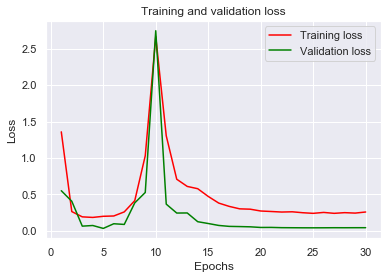

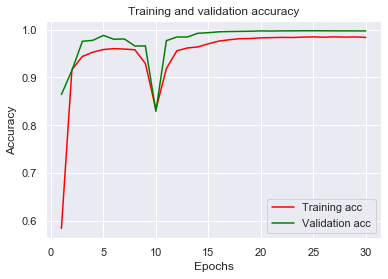

In [19]:
# eval_val_generator = image_generator_for_validating("validation")
eval_val_generator = val_image_generator.flow(x=X_test, y=Y_test, batch_size=BATCH_SIZE, shuffle=False)
print()

print("The final classification result on validation test...")
print("loss: %.2f" % train_log.history['val_loss'][-1])
print("acc:  %.2f" % train_log.history['val_acc'][-1])

loss = train_log.history['loss']
val_loss = train_log.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, color='red', label='Training loss')
plt.plot(epochs, val_loss, color='green', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

acc = train_log.history['acc']
val_acc = train_log.history['val_acc']
plt.plot(epochs, acc, color='red', label='Training acc')
plt.plot(epochs, val_acc, color='green', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

In [20]:
Y_pred = model.predict_generator(eval_val_generator, int(ceil(NUM_VAL_SAMPLE/BATCH_SIZE)))
y_pred = np.argmax(Y_pred, axis=1)
Y_test_1 = np.argmax(Y_test, axis=1)
print('Classification Report')
print(classification_report(y_pred=y_pred, y_true=Y_test_1, target_names=CLASSES))

Classification Report
              precision    recall  f1-score   support

           A       1.00      1.00      1.00       335
           B       1.00      1.00      1.00       316
           C       1.00      1.00      1.00       293
           D       1.00      1.00      1.00       295
           E       1.00      1.00      1.00       280
           F       1.00      1.00      1.00       339
           G       1.00      1.00      1.00       282
           H       1.00      1.00      1.00       307
           I       1.00      1.00      1.00       316
           K       0.99      1.00      1.00       292
           L       1.00      1.00      1.00       294
           M       1.00      0.99      1.00       301
           N       0.99      1.00      1.00       275
           O       1.00      1.00      1.00       264
           P       1.00      1.00      1.00       317
           Q       1.00      1.00      1.00       298
           R       1.00      1.00      1.00       286
     

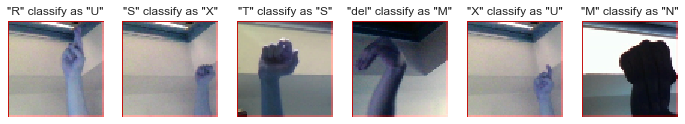

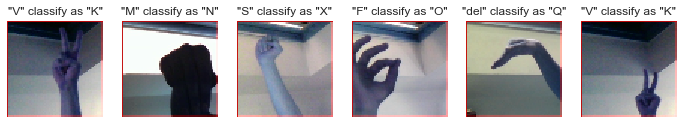

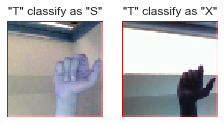

In [21]:
show_incorrect_classified_img(X_test, Y_test_1, y_pred)

Confusion matrix, without normalization


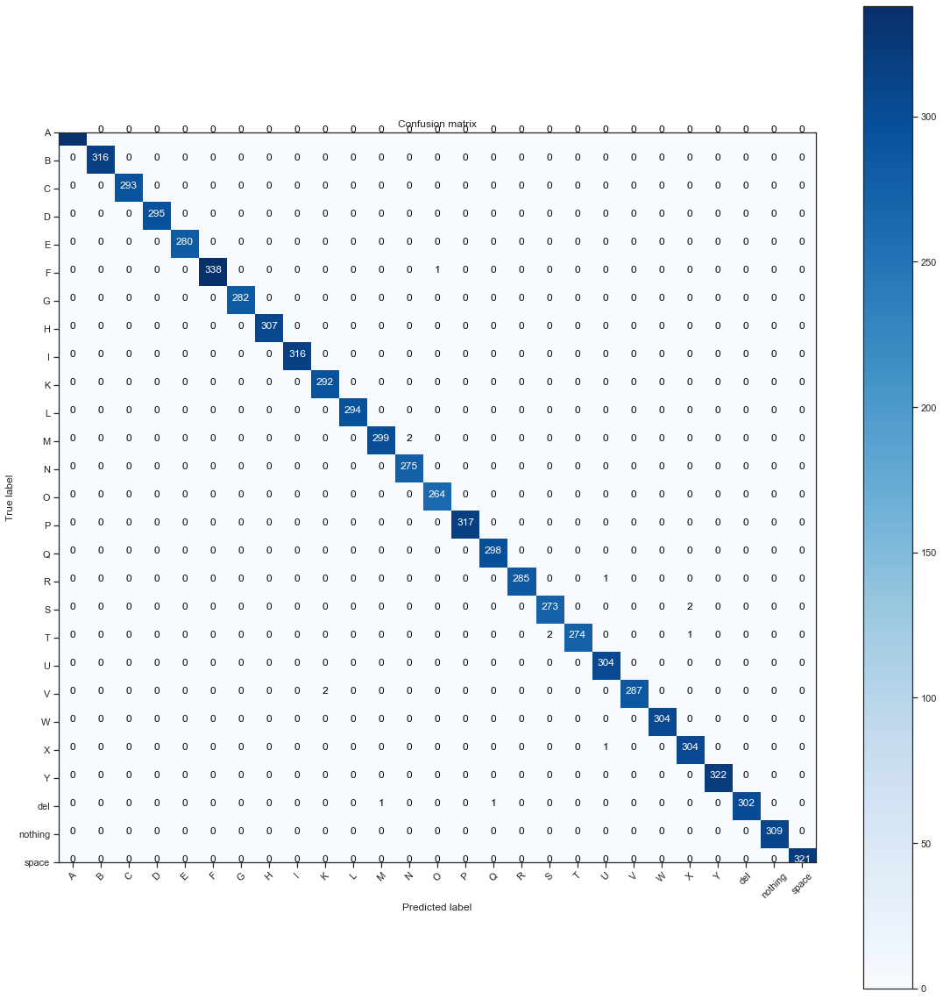

In [22]:
with sns.axes_style('ticks'):
    plot_confusion_matrix_with_default_options(y_pred=y_pred, y_true=Y_test_1, classes=CLASSES)
#     plot_confusion_matrix_with_default_options(y_pred=y_pred, y_true=eval_val_generator.classes, classes=CLASSES, 
#                                                options={'normalize': True})

In [23]:
# eval_test_generator = image_generator_for_testing()
eval_test_generator = val_image_generator.flow(x=X1_train, y=Y1_train, batch_size=BATCH_SIZE, shuffle=False)

NUM_TEST_SAMPLE = eval_test_generator.n
Y1_pred = model.predict_generator(eval_test_generator, int(ceil(NUM_TEST_SAMPLE/BATCH_SIZE)))
y1_pred = np.argmax(Y1_pred, axis=1)
Y1_test_1 = np.argmax(Y1_train, axis=1)
print('Classification Report')
print(classification_report(y_pred=y1_pred, y_true=Y1_test_1, target_names=CLASSES))

Classification Report
              precision    recall  f1-score   support

           A       0.00      0.00      0.00        30
           B       0.37      0.33      0.35        30
           C       0.47      0.27      0.34        30
           D       0.31      0.17      0.22        30
           E       0.28      0.17      0.21        30
           F       0.21      0.10      0.14        29
           G       0.29      0.33      0.31        30
           H       0.42      0.83      0.56        30
           I       0.40      0.41      0.41        29
           K       0.16      0.21      0.18        29
           L       0.70      0.23      0.35        30
           M       0.16      0.23      0.19        30
           N       0.11      0.40      0.17        30
           O       0.67      0.34      0.45        29
           P       0.18      0.80      0.29        30
           Q       0.30      0.53      0.38        30
           R       0.50      0.33      0.40        30
     

C:\Users\yut\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:17: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


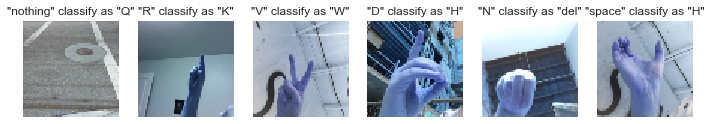

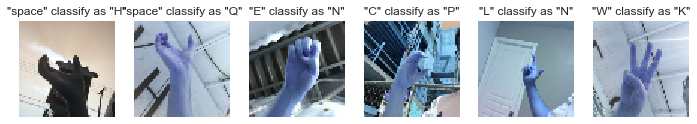

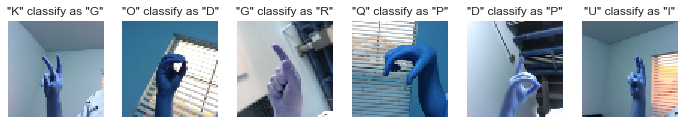

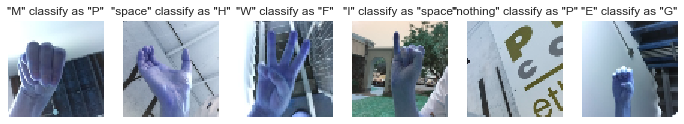

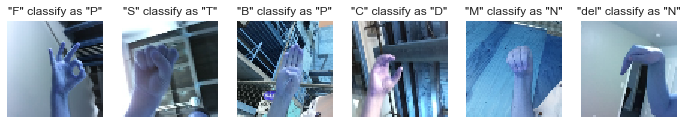

...

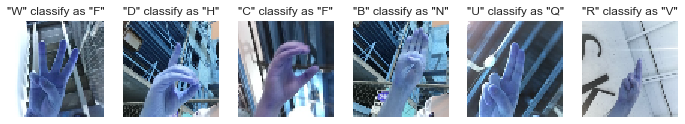

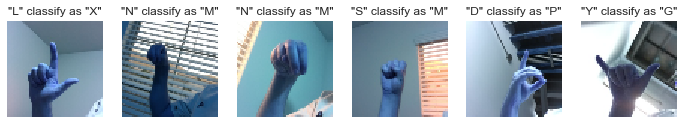

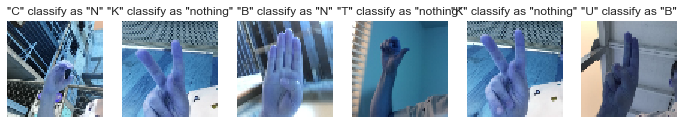

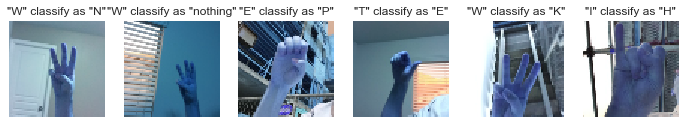

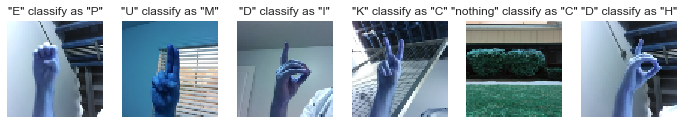

<Figure size 864x792 with 0 Axes>

In [24]:
show_incorrect_classified_img(X1_train, Y1_test_1, y1_pred)

Confusion matrix, without normalization


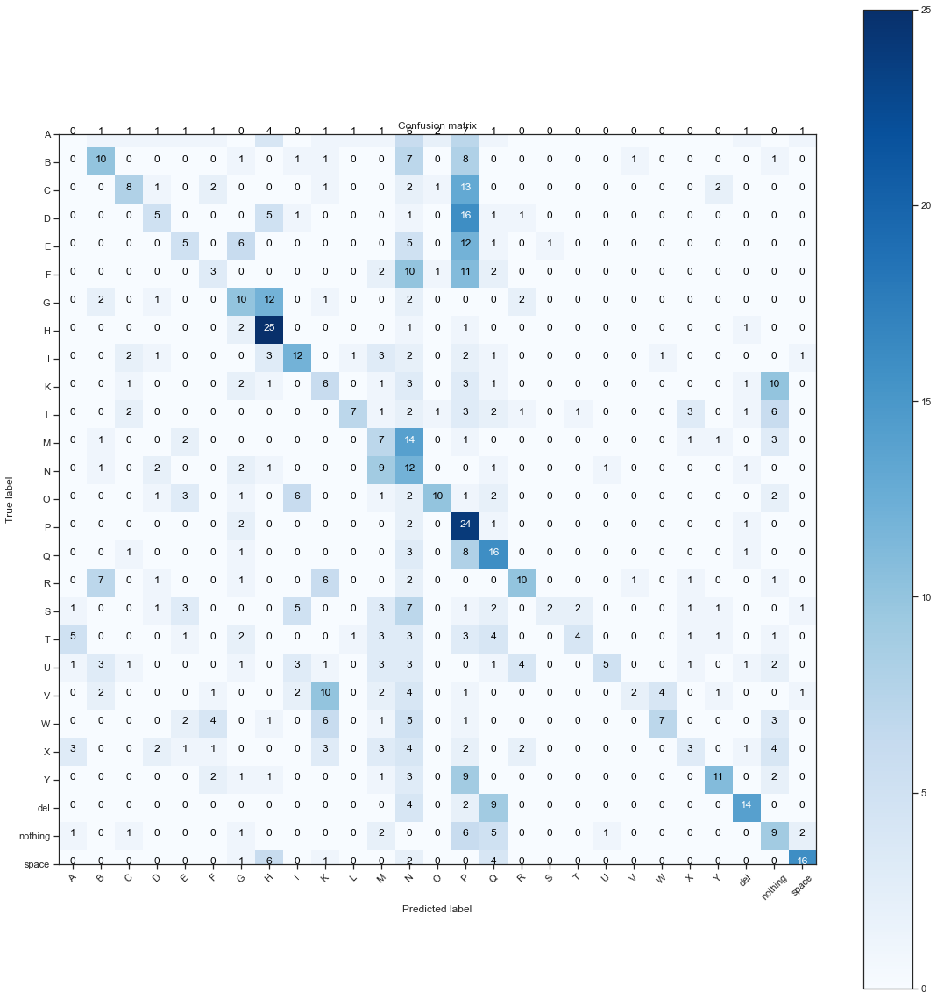

In [25]:
with sns.axes_style('ticks'):
    plot_confusion_matrix_with_default_options(y_pred=y1_pred, y_true=Y1_test_1, classes=CLASSES)
#     plot_confusion_matrix_with_default_options(y_pred=y_pred, y_true=eval_test_generator.classes, classes=CLASSES, 
#                                                options={'normalize': True})

C:\Users\yut\AppData\Roaming\Python\Python37\site-packages\ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide


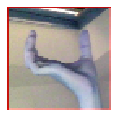

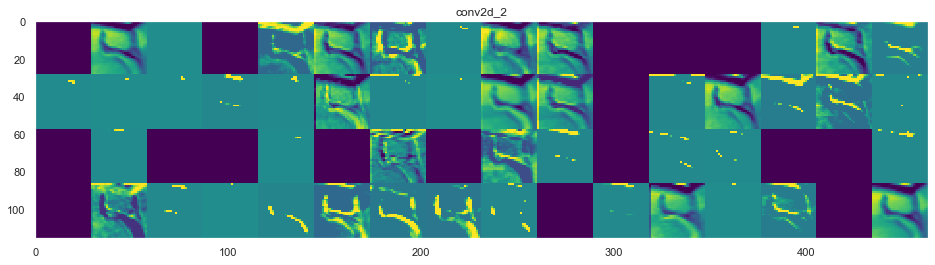

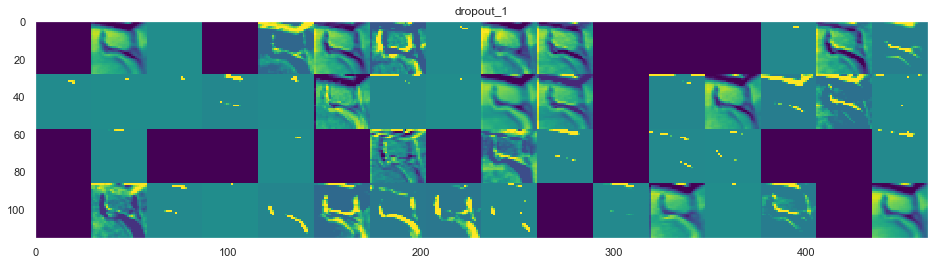

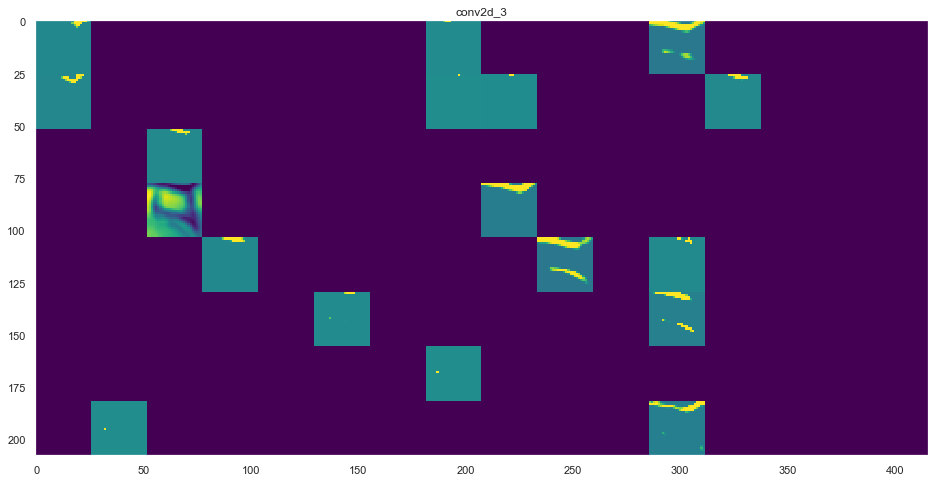

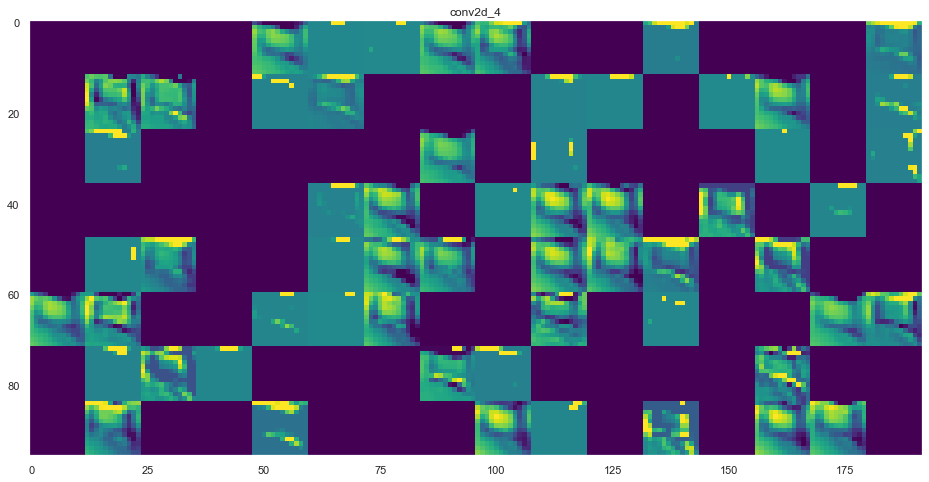

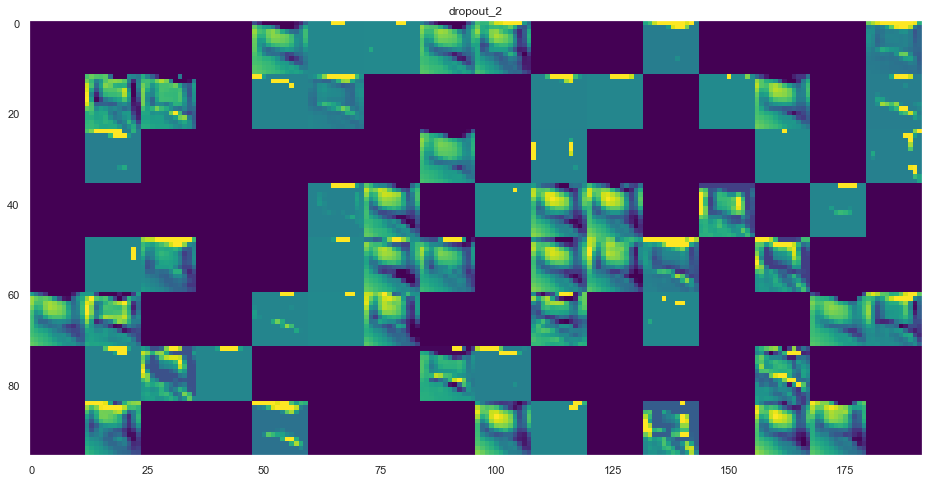

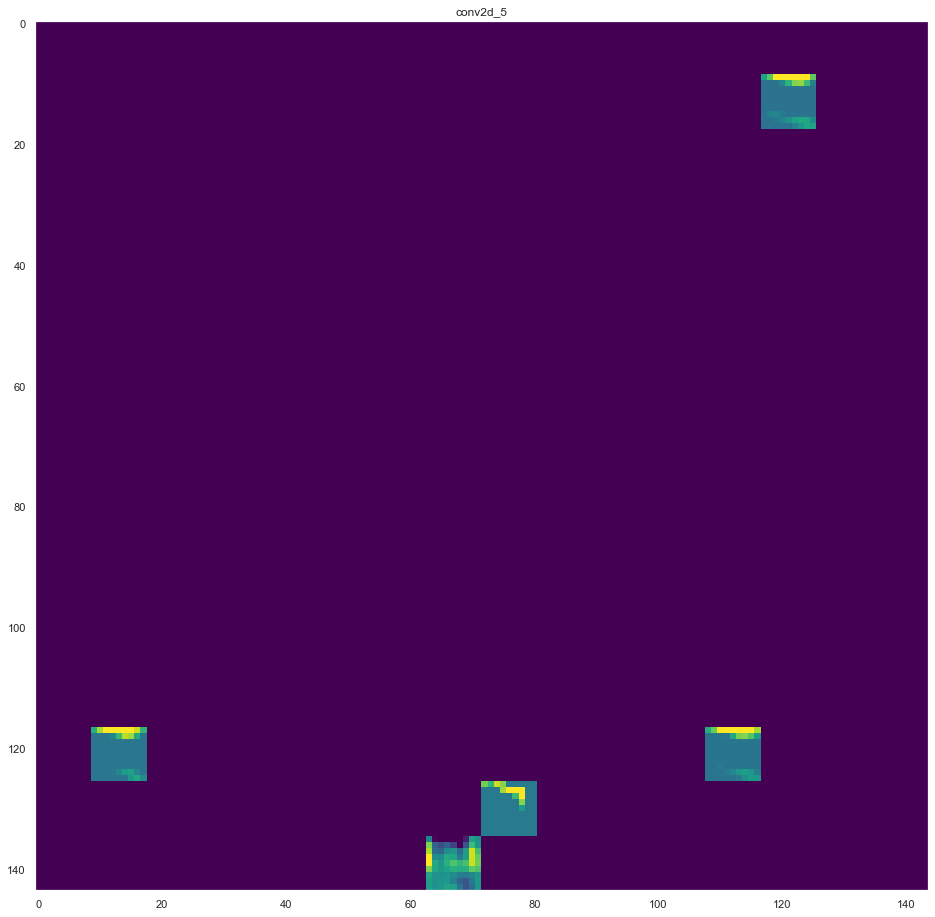

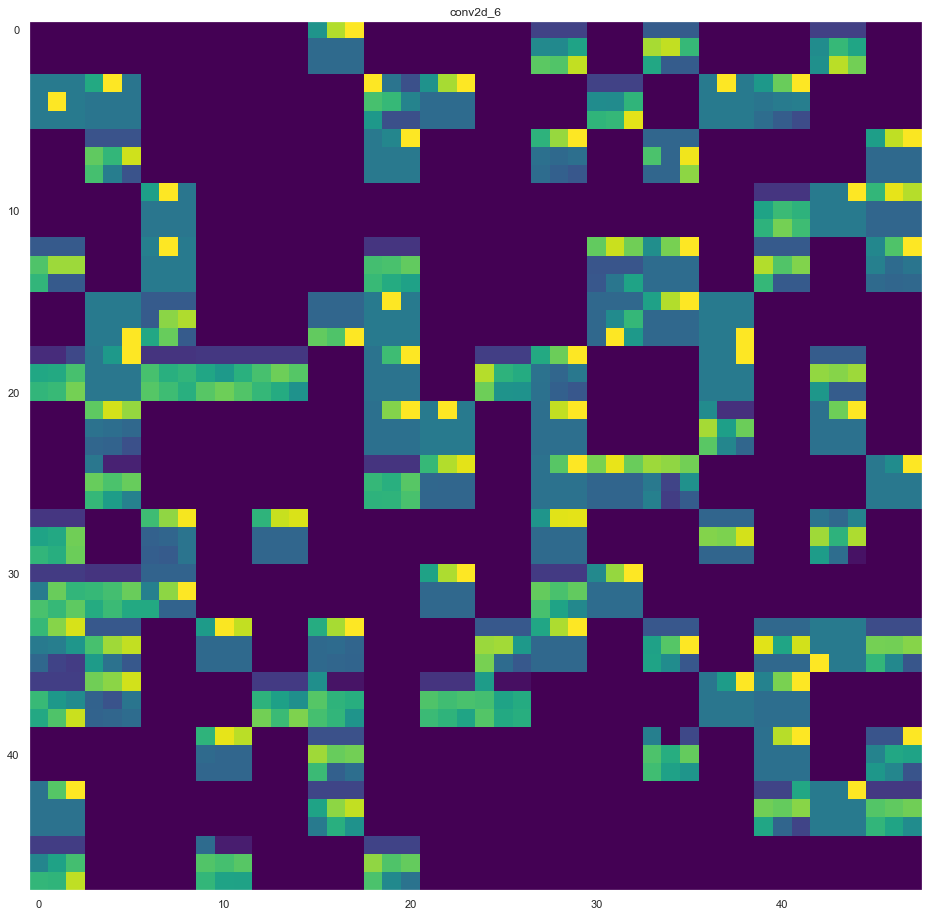

In [26]:
import keras
from keras import models

layers = model.layers[1:-4]
img = X_test[1:2,:,:,:]

# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in layers]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=model.input, outputs=layer_outputs)

# This will return a list of 5 Numpy arrays:
# one array per layer activation
activations = activation_model.predict(img)

fig = plt.figure(figsize=(12, 11))
sp = plt.subplot(5, 5, 1)
plt.imshow(img[0])
sp.axis('off')

# These are the names of the layers, so can have them as part of our plot
layer_names = []
for layer in layers:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
#     print(layer_activation.shape)
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0, :, :, col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')
    
plt.show()